In [4]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Embedding, Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pickle

# Load the Mendeley dataset
df = pd.read_csv('../../data/mendeley_data/HateSpeechDatasetBalanced.csv')



In [5]:


# Split the data into training and testing sets
train_texts, val_test_texts, train_labels, val_test_labels = train_test_split(df['Content'], df['Label'], test_size=0.2, random_state=42)
val_texts, test_texts, val_labels, test_labels = train_test_split(val_test_texts, val_test_labels, test_size=0.5, random_state=42)# Create a tokenizer instance
tokenizer = Tokenizer(num_words=10000)
tokenizer.fit_on_texts(train_texts)

# Convert the text data into sequences
train_sequences = tokenizer.texts_to_sequences(train_texts)
val_sequences = tokenizer.texts_to_sequences(val_texts)
test_sqeuences = tokenizer.texts_to_sequences(test_texts)

# Pad the sequences
max_length = 100
train_padded = pad_sequences(train_sequences, maxlen=max_length, padding='post')
val_padded = pad_sequences(val_sequences, maxlen=max_length, padding='post')
test_padded = pad_sequences(test_sqeuences , maxlen=max_length, padding='post')

# Clip the padded sequences to ensure indices are within [0, 5000)
train_padded = tf.clip_by_value(train_padded, 0, 5000)
val_padded = tf.clip_by_value(val_padded, 0, 5000)
test_padded = tf.clip_by_value(test_padded, 0, 5000)

# One-hot encode the labels
num_classes = 2
train_labels_onehot = tf.keras.utils.to_categorical(train_labels, num_classes)
val_labels_onehot = tf.keras.utils.to_categorical(val_labels, num_classes)

In [6]:
df

,Content,Label
0,denial of normal the con be asked to comment o...,1
1,just by being able to tweet this insufferable ...,1
2,that is retarded you too cute to be single tha...,1
3,thought of a real badass mongol style declarat...,1
4,afro american basho,1
...,...,...
726114,i mute this telecasting and played kanye west ...,1
726115,but hell yeah he s not a bachelor but looooooo...,1
726116,great video musician but s not my musician lol...,1
726117,not great pop video yeah he s not a pedophile ...,1


In [7]:

# Define the model architecture
model = Sequential([
    Embedding(input_dim=6000, output_dim=128, input_length=max_length),
    Bidirectional(LSTM(64, return_sequences=True)),
    Dropout(0.5),
    Bidirectional(LSTM(64)),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])



d:\AnaConda\envs\project\lib\site-packages\keras\src\layers\core\embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [8]:
# Compile the mode
model.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9), metrics=['accuracy'])

# Train the model
history = model.fit(
    train_padded, train_labels_onehot,
    validation_data=(val_padded, val_labels_onehot),
    epochs=5,
    verbose=1
)



Epoch 1/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2517s 138ms/step - accuracy: 0.6809 - loss: 0.5712 - val_accuracy: 0.7887 - val_loss: 0.4553
Epoch 2/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2340s 129ms/step - accuracy: 0.8029 - loss: 0.4332 - val_accuracy: 0.8205 - val_loss: 0.4006
Epoch 3/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2157s 119ms/step - accuracy: 0.8249 - loss: 0.3896 - val_accuracy: 0.8303 - val_loss: 0.3752
Epoch 4/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2159s 119ms/step - accuracy: 0.8297 - loss: 0.3757 - val_accuracy: 0.8321 - val_loss: 0.3655
Epoch 5/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2595s 143ms/step - accuracy: 0.8332 - loss: 0.3666 - val_accuracy: 0.8356 - val_loss: 0.3576


In [9]:

# Evaluate the model
test_loss, test_accuracy = model.evaluate(val_padded, val_labels_onehot)
print(f'Test Accuracy: {test_accuracy:.3f}')


2270/2270 ━━━━━━━━━━━━━━━━━━━━ 149s 65ms/step - accuracy: 0.8350 - loss: 0.3601
Test Accuracy: 0.836


In [10]:
# Save the history to a pickle file
with open('training_history_copy_data_2.pkl', 'wb') as file:
    pickle.dump(history.history, file)

In [11]:
model.save('hate_speech_model_copy_data_2.h5')

In [12]:
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 100, 128)       │       768,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 100, 128)       │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,948,038 (7.43 MB)

 Trainable params: 974,018 (3.72 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 974,020 (3.72 MB)

In [47]:
# Load the pickle file
with open('training_history_copy_data_2.pkl', 'rb') as f:
    history = pickle.load(f)

# Inspect the contents of the history
print(history.keys())


dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


In [57]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# Plotting training & validation accuracy and loss
def plot_history(history):
    # Plot accuracy
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='train accuracy')
    plt.plot(history.history['val_accuracy'], label='val accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='train loss')
    plt.plot(history.history['val_loss'], label='val loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')

    plt.show()
    
    
    

In [13]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# Plotting training & validation accuracy and loss
def plot_history(history):
    # Plot accuracy
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='train accuracy')
    plt.plot(history.history['val_accuracy'], label='val accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='train loss')
    plt.plot(history.history['val_loss'], label='val loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper left')

    plt.show()
    
    
    

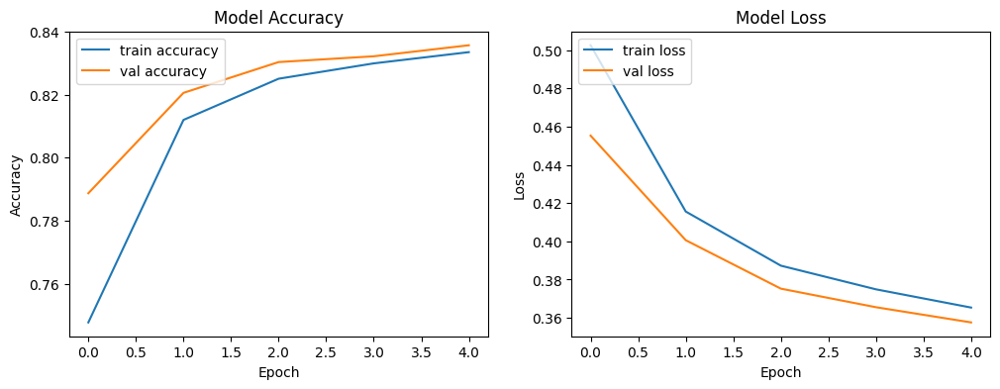

2270/2270 ━━━━━━━━━━━━━━━━━━━━ 151s 66ms/step


In [14]:
plot_history(history)

# Predicting the labels for the test set
test_predictions = (model.predict(test_padded) > 0.5).astype('int32')



Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.81      0.83     35956
           1       0.82      0.86      0.84     36656

    accuracy                           0.83     72612
   macro avg       0.84      0.83      0.83     72612
weighted avg       0.84      0.83      0.83     72612



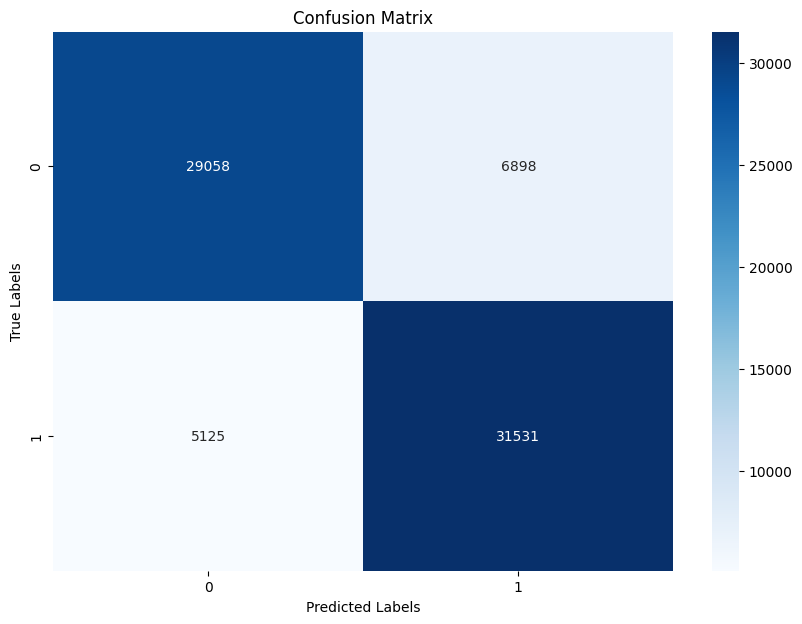

Accuracy: 0.8344
Precision: 0.8205
Recall: 0.8602
F1-Score: 0.8399


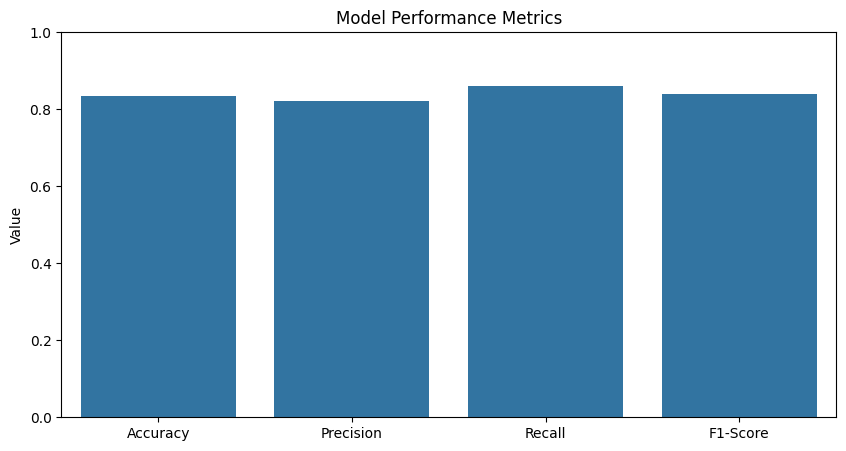

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Predicting the labels for the test set
test_predictions_classes = np.argmax(test_predictions, axis=1)

# Confusion Matrix
conf_matrix = confusion_matrix(test_labels, test_predictions_classes)

# Classification Report
class_report = classification_report(test_labels, test_predictions_classes, output_dict=True)
print("Classification Report:")
print(classification_report(test_labels, test_predictions_classes))

# Plot Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Extracting metrics
accuracy = class_report['accuracy']
precision = class_report['1']['precision']
recall = class_report['1']['recall']
f1_score = class_report['1']['f1-score']


# Printing the metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1_score:.4f}")


# Plotting the bar chart for accuracy, precision, recall, and F1-score
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
values = [accuracy, precision, recall, f1_score]

plt.figure(figsize=(10, 5))
sns.barplot(x=metrics, y=values)
plt.title('Model Performance Metrics')
plt.ylabel('Value')
plt.ylim(0, 1)  # Metrics range between 0 and 1
plt.show()


Accuracy: Your model achieves a test accuracy of 0.757, which is a decent score considering the complexity of the Mendeley dataset.

Classification Report: The classification report provides a detailed breakdown of your model's performance on each class. Here are some key takeaways:

Class 0: Your model has a precision of 0.89, recall of 0.59, and F1-score of 0.71 for class 0. This suggests that your model is good at identifying true negatives (class 0) but may be missing some true positives.
Class 1: Your model has a precision of 0.69, recall of 0.93, and F1-score of 0.79 for class 1. This indicates that your model is good at identifying true positives (class 1) but may be misclassifying some true negatives as positives.

Confusion Matrix: The confusion matrix shows that your model is making some mistakes, particularly in the top-right quadrant (false positives) and bottom-left quadrant (false negatives).

Model Performance Metrics: The bar chart shows that your model's accuracy, precision, recall, and F1-score are all around 0.7-0.8, indicating that your model is performing reasonably well but has room for improvement.

Areas for Improvement:

Class imbalance: The Mendeley dataset appears to be imbalanced, with class 0 having slightly more instances than class 1. This can affect your model's performance, particularly if it's biased towards the majority class.
Hyperparameter tuning: You may want to experiment with different hyperparameters, such as the number of epochs, batch size, learning rate, and dropout rates, to see if you can improve your model's performance.
Model architecture: You could try experimenting with different architectures, such as using a Convolutional Neural Network (CNN) or a Transformer-based model, to see if they perform better on this dataset


Model Performance Metrics: The bar chart shows that your model's accuracy, precision, recall, and F1-score are all around 0.7-0.8, indicating that your model is performing reasonably well but has room for improvement.

In [16]:
from tensorflow.keras.models import load_model
import pickle
from tensorflow.keras.preprocessing.sequence import pad_sequences
 
# Load the model
model = load_model('hate_speech_model_copy_data_2.h5')
 
# Load the tokenizer
with open("../../notebooks/tokenizer.pkl", 'rb') as handle:
    tokenizer = pickle.load(handle)
 
# Define a function to preprocess and make predictions on new text data
def predict_hate_speech(text):
    # Tokenize the text
    tokens = tokenizer.texts_to_sequences([text])
   
    # Pad the sequence
    padded_sequence = pad_sequences(tokens, maxlen=500, padding='post')
   
    # Make predictions
    prediction = model.predict(padded_sequence)
   
    # Apply thresholding
    if prediction[0][0] >= 0.5:
        return "Hate speech detected"
    else:
        return "No hate speech detected"
 
# Test the function
new_text = "ugly boy"
print(predict_hate_speech(new_text))

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step
Hate speech detected


In [17]:
print(f"Train labels distribution:\n{pd.Series(train_labels).value_counts()}")
print(f"Validation labels distribution:\n{pd.Series(val_labels).value_counts()}")
print(f"Test labels distribution:\n{pd.Series(test_labels).value_counts()}")


Train labels distribution:
Label
1    291344
0    289551
Name: count, dtype: int64
Validation labels distribution:
Label
1    36525
0    36087
Name: count, dtype: int64
Test labels distribution:
Label
1    36656
0    35956
Name: count, dtype: int64


In [18]:
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 100, 128)       │       768,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 100, 128)       │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 974,020 (3.72 MB)

 Trainable params: 974,018 (3.72 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [19]:
for i in range(5):
    print(f"Text: {train_texts[i]}")
    print(f"Sequence: {train_sequences[i]}")
    print(f"Padded Sequence: {train_padded[i]}")
    print(f"Label: {train_labels_onehot[i]}")


Text: denial of normal the con be asked to comment on tragedies an emotional retard
Sequence: [17, 73, 76, 4, 349, 24, 153, 45, 10, 4235, 24, 641, 468, 24, 540, 3183, 6, 3, 305, 80, 3067, 2, 24, 1767, 51, 2874, 25, 514, 61, 224, 24, 45, 12, 439, 564]
Padded Sequence: [  17   73   76    4  349   24  153   45   10 4235   24  641  468   24
  540 3183    6    3  305   80 3067    2   24 1767   51 2874   25  514
   61  224   24   45   12  439  564    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0]
Label: [1. 0.]
Text: just by being able to tweet this insufferable bullshit proves trump a nazi you vagina
Sequence: [126, 41, 7966, 2077, 3921]
Padded Sequence: [ 126   41 5000 2077 3921    0    0    0    0    0    0    0 

In [20]:
pretrained_model = load_model("hate_speech_model_copy_data_2.h5")

In [21]:
# Add new layers on top of the pre-trained model
new_model = Sequential(pretrained_model.layers)
new_model.add(Dense(32, activation='relu'))
new_model.add(Dropout(0.5))
new_model.add(Dense(num_classes, activation='softmax'))



In [22]:

# Compile the new model
new_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [23]:
# Train the new model
history_new = new_model.fit(
    train_padded, train_labels_onehot,
    validation_data=(val_padded, val_labels_onehot),
    epochs=1,
    verbose=1
)

18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2777s 153ms/step - accuracy: 0.8133 - loss: 0.4227 - val_accuracy: 0.8472 - val_loss: 0.3391


In [24]:
new_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 100, 128)       │       768,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 100, 128)       │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           130 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,922,542 (11.15 MB)

 Trainable params: 974,180 (3.72 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,948,362 (7.43 MB)

In [25]:
# Save the history to a pickle file
with open('training_history_copy_data_2_retain.pkl', 'wb') as file:
    pickle.dump(history_new.history, file)

In [26]:
model.save("hate_speech_model_copy_data_2_retrain.h5")

In [ ]:
new_model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 100, 128)       │       768,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 100, 128)       │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           130 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,922,542 (11.15 MB)

 Trainable params: 974,180 (3.72 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,948,362 (7.43 MB)

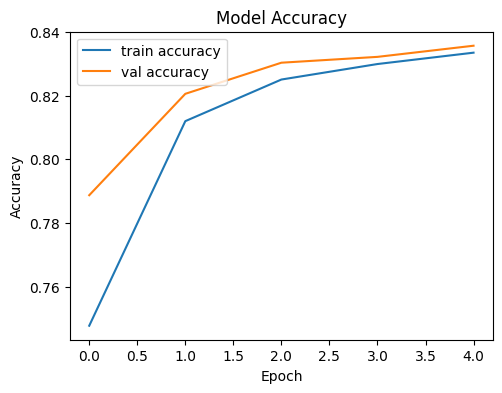

In [27]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')


In [29]:
#dicting the labels for the test set
new_test_predictions = (new_model.predict(test_padded) > 0.5).astype('int32')

2270/2270 ━━━━━━━━━━━━━━━━━━━━ 102s 45ms/step


Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.84      0.84     35956
           1       0.84      0.85      0.85     36656

    accuracy                           0.85     72612
   macro avg       0.85      0.85      0.85     72612
weighted avg       0.85      0.85      0.85     72612



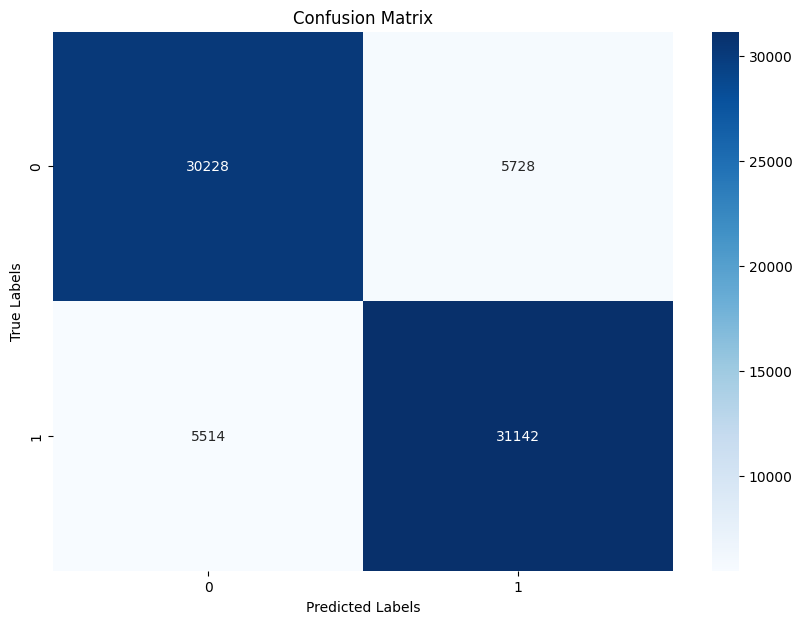

Accuracy: 0.8452
Precision: 0.8446
Recall: 0.8496
F1-Score: 0.8471


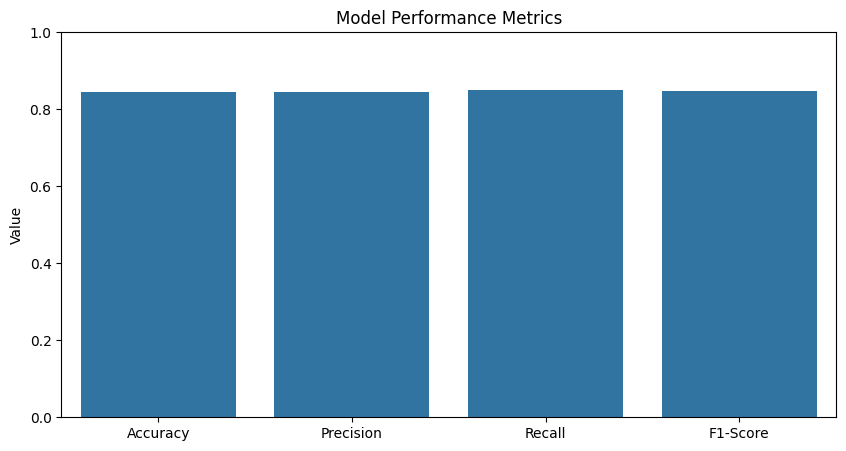

In [30]:

# Predicting the labels for the test set
new_test_predictions_classes = np.argmax(new_test_predictions, axis=1)

# Confusion Matrix
conf_matrix = confusion_matrix(test_labels, new_test_predictions_classes)

# Classification Report
class_report = classification_report(test_labels, new_test_predictions_classes, output_dict=True)
print("Classification Report:")
print(classification_report(test_labels, new_test_predictions_classes))

# Plot Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Extracting metrics
accuracy = class_report['accuracy']
precision = class_report['1']['precision']
recall = class_report['1']['recall']
f1_score = class_report['1']['f1-score']


# Printing the metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1_score:.4f}")


# Plotting the bar chart for accuracy, precision, recall, and F1-score
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
values = [accuracy, precision, recall, f1_score]

plt.figure(figsize=(10, 5))
sns.barplot(x=metrics, y=values)
plt.title('Model Performance Metrics')
plt.ylabel('Value')
plt.ylim(0, 1)  # Metrics range between 0 and 1
plt.show()


In [31]:
third_model = load_model("hate_speech_model_copy_data_2_retrain.h5")


In [32]:
# Add new layers on top of the pre-trained model
n_m = Sequential(third_model.layers)
n_m.add(Dense(32,activation='relu'))
n_m.add(Dropout(0.5))
n_m.add(Dense(32,activation='relu'))
n_m.add(Dropout(0.5))
n_m.add(Dense(num_classes, activation='softmax'))


In [33]:

# Compile the new model
n_m.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [34]:
# Train the new model
history_3 = n_m.fit(
    train_padded, train_labels_onehot,
    validation_data=(val_padded, val_labels_onehot),
    epochs=5,
    verbose=1
)

Epoch 1/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2310s 127ms/step - accuracy: 0.8169 - loss: 0.4131 - val_accuracy: 0.8476 - val_loss: 0.3408
Epoch 2/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2300s 127ms/step - accuracy: 0.8489 - loss: 0.3457 - val_accuracy: 0.8546 - val_loss: 0.3222
Epoch 3/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2288s 126ms/step - accuracy: 0.8632 - loss: 0.3195 - val_accuracy: 0.8586 - val_loss: 0.3194
Epoch 4/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 2289s 126ms/step - accuracy: 0.8734 - loss: 0.3001 - val_accuracy: 0.8594 - val_loss: 0.3127
Epoch 5/5
18153/18153 ━━━━━━━━━━━━━━━━━━━━ 21218s 1s/step - accuracy: 0.8819 - loss: 0.2835 - val_accuracy: 0.8628 - val_loss: 0.3156


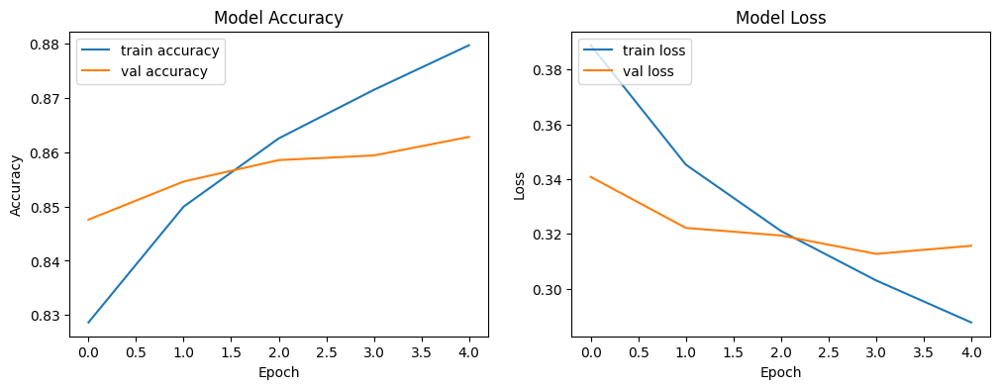

In [35]:
plot_history(history_3)

In [38]:
n_m.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 100, 128)       │       768,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (None, 100, 128)       │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           130 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,925,710 (11.16 MB)

 Trainable params: 975,236 (3.72 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,950,474 (7.44 MB)

In [39]:
#dicting the labels for the test set
new_test_predictions_3 = (n_m.predict(test_padded) > 0.5).astype('int32')

2270/2270 ━━━━━━━━━━━━━━━━━━━━ 98s 43ms/step


Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.86      0.86     35956
           1       0.86      0.87      0.86     36656

    accuracy                           0.86     72612
   macro avg       0.86      0.86      0.86     72612
weighted avg       0.86      0.86      0.86     72612



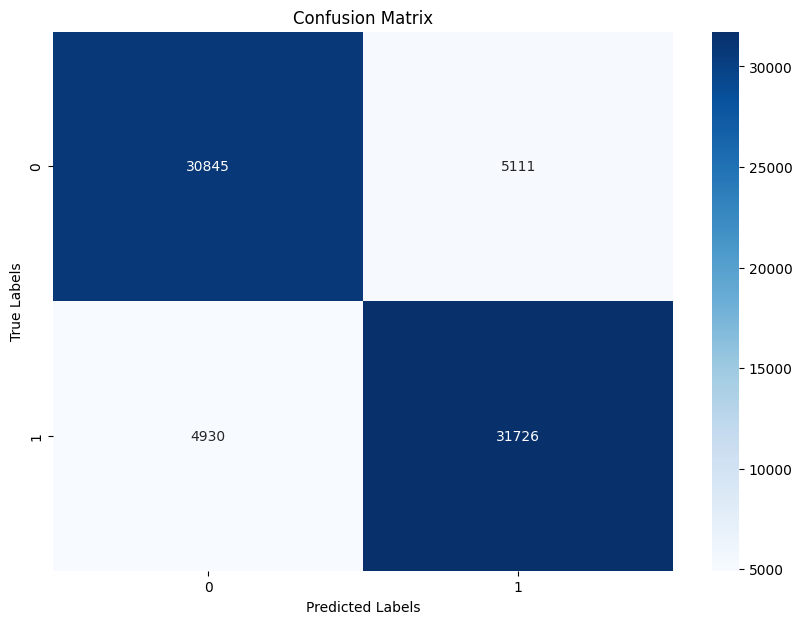

Accuracy: 0.8617
Precision: 0.8613
Recall: 0.8655
F1-Score: 0.8634


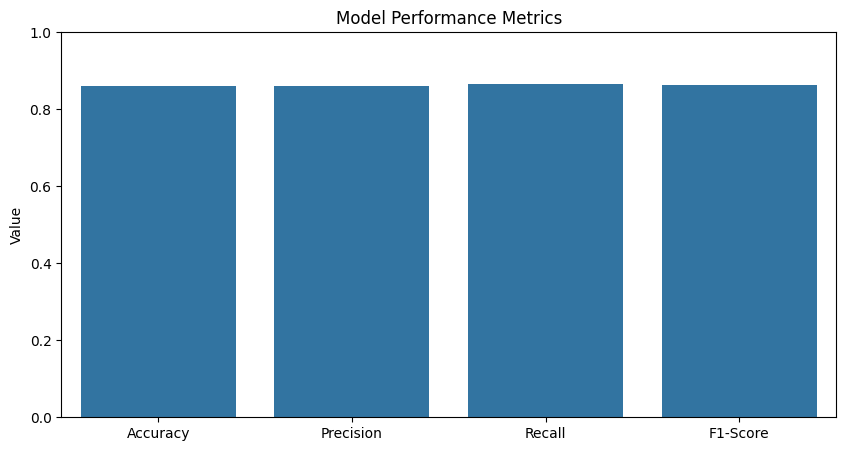

In [43]:

# Predicting the labels for the test set
new_test_predictions_classes_3 = np.argmax(new_test_predictions_3, axis=1)

# Confusion Matrix
conf_matrix = confusion_matrix(test_labels, new_test_predictions_classes_3)

# Classification Report
class_report = classification_report(test_labels, new_test_predictions_classes_3, output_dict=True)
print("Classification Report:")
print(classification_report(test_labels, new_test_predictions_classes_3))

# Plot Confusion Matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Extracting metrics
accuracy = class_report['accuracy']
precision = class_report['1']['precision']
recall = class_report['1']['recall']
f1_score = class_report['1']['f1-score']


# Printing the metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1_score:.4f}")


# Plotting the bar chart for accuracy, precision, recall, and F1-score
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
values = [accuracy, precision, recall, f1_score]

plt.figure(figsize=(10, 5))
sns.barplot(x=metrics, y=values)
plt.title('Model Performance Metrics')
plt.ylabel('Value')
plt.ylim(0, 1)  # Metrics range between 0 and 1
plt.show()


In [58]:
n_m.save("hate_speech_model_copy_data_2_retrain_3.h5")

In [59]:
# Save the history to a pickle file
with open('training_history_copy_data_2_retain_3.pkl', 'wb') as file:
    pickle.dump(history_3.history, file)

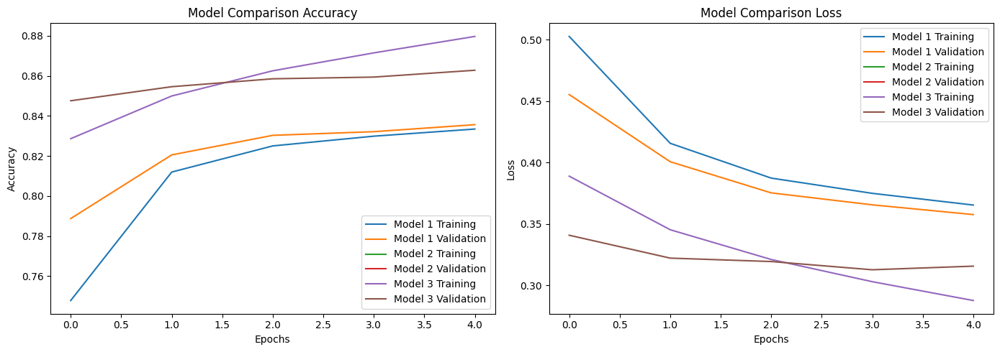

In [64]:
import matplotlib.pyplot as plt
import pickle

# Load the history data from pickle files
with open('training_history_copy_data_2.pkl', 'rb') as f:
    history1 = pickle.load(f)
with open('training_history_copy_data_2_retain.pkl', 'rb') as f:
    history2 = pickle.load(f)
with open('training_history_copy_data_2_retain_3.pkl', 'rb') as f:
    history3 = pickle.load(f)

# Define function to plot training history
def plot_history(histories, title):
    plt.figure(figsize=(14, 5))
    
    # Accuracy Plot
    plt.subplot(1, 2, 1)
    for i, history in enumerate(histories):
        plt.plot(history['accuracy'], label=f'Model {i+1} Training')
        plt.plot(history['val_accuracy'], label=f'Model {i+1} Validation')
    plt.title(f'{title} Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Loss Plot
    plt.subplot(1, 2, 2)
    for i, history in enumerate(histories):
        plt.plot(history['loss'], label=f'Model {i+1} Training')
        plt.plot(history['val_loss'], label=f'Model {i+1} Validation')
    plt.title(f'{title} Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Plot the histories
plot_history([history1, history2, history3], 'Model Comparison')


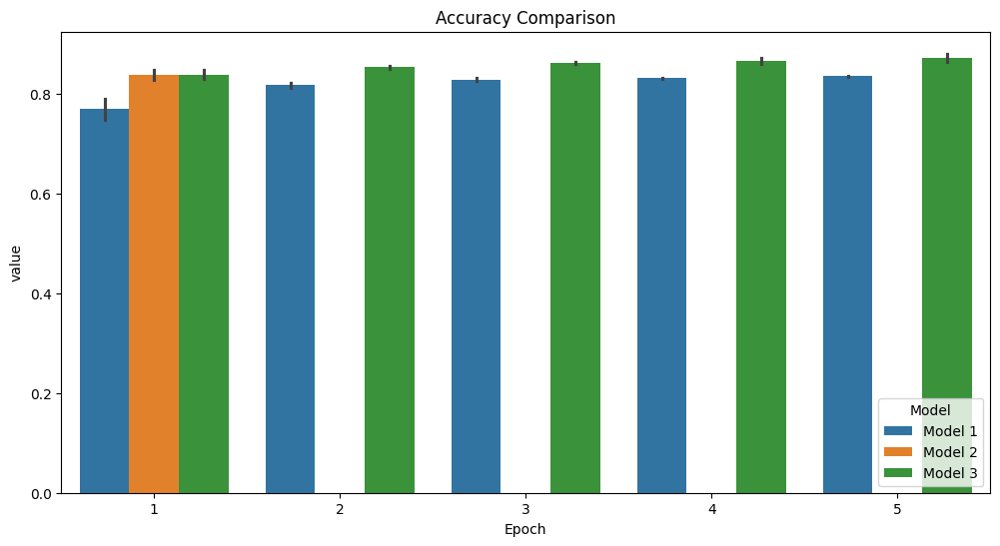

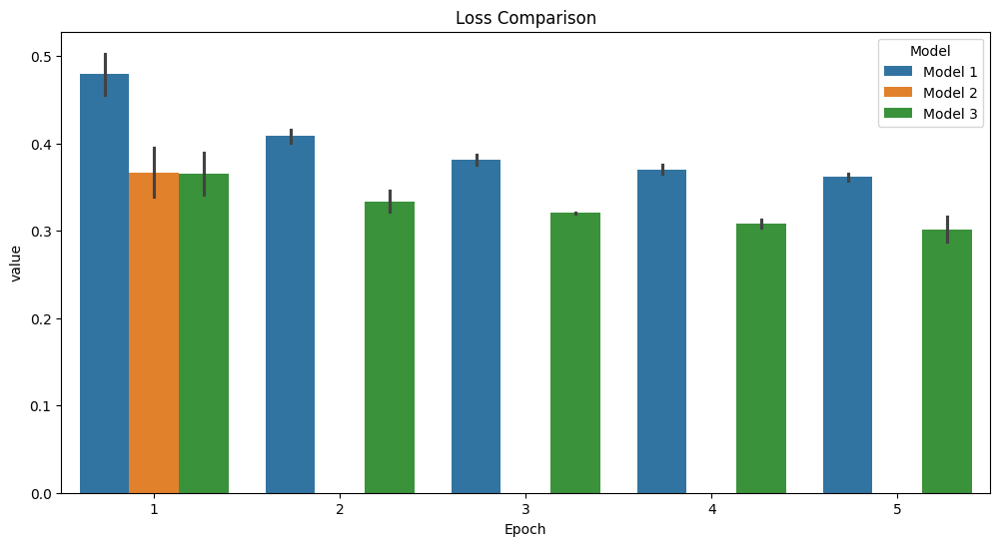

In [65]:
# Extract the relevant data into a DataFrame
def extract_data(history, model_name):
    data = {
        'Epoch': list(range(1, len(history['accuracy']) + 1)),
        'Training Accuracy': history['accuracy'],
        'Validation Accuracy': history['val_accuracy'],
        'Training Loss': history['loss'],
        'Validation Loss': history['val_loss'],
        'Model': [model_name] * len(history['accuracy'])
    }
    return pd.DataFrame(data)

df1 = extract_data(history1, 'Model 1')
df2 = extract_data(history2, 'Model 2')
df3 = extract_data(history3, 'Model 3')

# Concatenate all data into a single DataFrame
df = pd.concat([df1, df2, df3])

# Plot accuracy and loss using seaborn
def plot_metrics(df, metric, title):
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Epoch', y=metric, hue='Model', data=df)
    plt.title(title)
    plt.show()

# Plot Training and Validation Accuracy
plot_metrics(df.melt(id_vars=['Epoch', 'Model'], value_vars=['Training Accuracy', 'Validation Accuracy']), 'value', 'Accuracy Comparison')

# Plot Training and Validation Loss
plot_metrics(df.melt(id_vars=['Epoch', 'Model'], value_vars=['Training Loss', 'Validation Loss']), 'value', 'Loss Comparison')

C:\Users\Shehryar Mirza\AppData\Local\Temp\ipykernel_13100\2456570257.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='Validation Accuracy', data=df, palette='viridis')
C:\Users\Shehryar Mirza\AppData\Local\Temp\ipykernel_13100\2456570257.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='Validation Loss', data=df, palette='viridis')


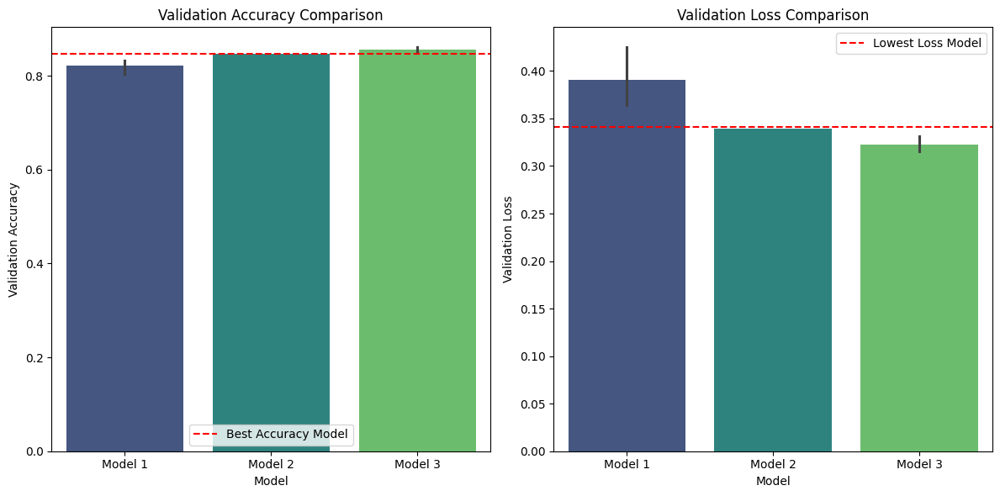

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df contains the concatenated DataFrame with metrics from different models

# Determine the best model based on validation accuracy
best_model_accuracy = df.groupby('Model')['Validation Accuracy'].max().idxmax()

# Determine the best model based on validation loss
best_model_loss = df.groupby('Model')['Validation Loss'].min().idxmin()

# Plotting the comparison
plt.figure(figsize=(12, 6))

# Plot for Validation Accuracy
plt.subplot(1, 2, 1)
sns.barplot(x='Model', y='Validation Accuracy', data=df, palette='viridis')
plt.title('Validation Accuracy Comparison')
plt.axhline(df[df['Model']==best_model_accuracy]['Validation Accuracy'].values[0], color='red', linestyle='--', label='Best Accuracy Model')
plt.legend()

# Plot for Validation Loss
plt.subplot(1, 2, 2)
sns.barplot(x='Model', y='Validation Loss', data=df, palette='viridis')
plt.title('Validation Loss Comparison')
plt.axhline(df[df['Model']==best_model_loss]['Validation Loss'].values[0], color='red', linestyle='--', label='Lowest Loss Model')
plt.legend()

plt.tight_layout()
plt.show()


In [100]:
from tensorflow.keras.models import load_model
import pickle
from tensorflow.keras.preprocessing.sequence import pad_sequences
 
# Load the model
model = load_model('hate_speech_model_copy_data_2_retrain_3.h5')
 
# Load the tokenizer
with open("hate_speech_tokenizer.pkl", 'rb') as handle:
    tokenizer = pickle.load(handle)
 
# Define a function to preprocess and make predictions on new text data
def predict_hate_speech(text, threshold=0.5):
    # Tokenize the text
    tokens = tokenizer.texts_to_sequences([text])
   
    # Pad the sequence
    padded_sequence = pad_sequences(tokens, maxlen=500, padding='post')
   
    # Make predictions
    prediction = model.predict(padded_sequence)
   
    # Apply thresholding
    if prediction[0][0] >= threshold:
        return "Hate speech detected"
    else:
        return "No hate speech detected"
 
# Test the function
new_text = "ugly boy"
#print(predict_hate_speech(new_text))
print(predict_hate_speech(new_text, threshold=0.5))  # Default threshold
#print(predict_hate_speech(new_text, threshold=0.3))  # Adjusted threshold
print(predict_hate_speech(new_text, threshold=0.7))  # Adjusted threshold

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step
Hate speech detected
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
No hate speech detected


In [88]:
import pickle

# Specify the path to your tokenizer pickle file
tokenizer_pkl_path = '../../notebooks/tokenizer.pkl'

# Load the tokenizer from the pickle file
try:
    with open(tokenizer_pkl_path, 'rb') as f:
        tokenizer = pickle.load(f)
        print("Tokenizer loaded successfully.")
        # Optionally, print or inspect the tokenizer
        print(tokenizer)  # This will print the tokenizer object
except FileNotFoundError:
    print(f"Tokenizer pickle file not found at {tokenizer_pkl_path}.")
except Exception as e:
    print(f"Error occurred while loading tokenizer: {e}")


Tokenizer loaded successfully.


In [76]:
# Print all attributes and methods of the tokenizer object
print(dir(tokenizer))


['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_api_export_path', '_api_export_symbol_id', 'analyzer', 'char_level', 'document_count', 'filters', 'fit_on_sequences', 'fit_on_texts', 'get_config', 'index_docs', 'index_word', 'lower', 'num_words', 'oov_token', 'sequences_to_matrix', 'sequences_to_texts', 'sequences_to_texts_generator', 'split', 'texts_to_matrix', 'texts_to_sequences', 'texts_to_sequences_generator', 'to_json', 'word_counts', 'word_docs', 'word_index']


In [77]:
# Example: Access vocabulary size
vocab_size = len(tokenizer.word_index)
print(f"Vocabulary Size: {vocab_size}")

# Example: Access tokenizer configuration
tokenizer_config = tokenizer.get_config()
print(tokenizer_config)


Vocabulary Size: 116087
{'num_words': 10000, 'filters': '!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n', 'lower': True, 'split': ' ', 'char_level': False, 'oov_token': None, 'document_count': 435671, 'word_counts': '{"mom": 1626, "daj": 150, "lake": 437, "find": 11230, "out": 36668, "tbi": 150, "great": 8225, "not": 206015, "applicable": 3701, "nih": 583, "get": 30782, "is": 289198, "jean": 591, "you": 377657, "gave": 1992, "kick": 1052, "ass": 11067, "i": 352022, "on": 120778, "nije": 153, "squad": 295, "effort": 1914, "mater": 198, "ucla": 78, "the": 597753, "see": 35504, "euglenas": 4, "bole": 198, "overdose": 1753, "any": 33860, "gore": 200, "gay": 6505, "men": 7050, "are": 161647, "please": 33959, "do": 90191, "vandalize": 2279, "pages": 10877, "as": 93164, "did": 27695, "with": 92983, "this": 130235, "edit": 18631, "to": 401414, "caving": 4, "if": 76367, "continue": 4891, "so": 65355, "will": 57654, "be": 115735, "blocked": 8155, "from": 53817, "editing": 10604, "perhaps": 3980, "informat

In [78]:
# Example: Print first few entries of word_index
print("Word Index:")
for word, index in tokenizer.word_index.items():
    print(f"{word}: {index}")
    if index >= 10:  # Just print a few entries for brevity
        break


Word Index:
the: 1
to: 2
a: 3
you: 4
i: 5
and: 6
is: 7
of: 8
that: 9
it: 10
